In [3]:
from collections import defaultdict, Counter 
import colorsys
import itertools
import pickle 
import os
import shutil
import subprocess

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
plt.switch_backend('agg')
import matplotlib.image as mpimg
from matplotlib.backends.backend_pdf import PdfPages
from PIL import Image
from PyPDF2 import PdfFileWriter, PdfFileReader, PdfFileMerger
import io
from reportlab.pdfgen import canvas
from reportlab.lib.pagesizes import letter
from IPython.display import display, HTML

import ot
from scipy.spatial import distance, ConvexHull
from scipy.stats import spearmanr
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import mutual_info_score, normalized_mutual_info_score
from sklearn.manifold import TSNE
import fcsparser 
from ete3 import Tree, TreeNode, TreeStyle, TextFace, add_face_to_node

from utils import *

data_dir = '.'

## Generate HTMLs for BALBc-1

In [10]:
'''
sample_name = 'BALBc-1'
#num_clusters, num_neighbors = get_unique_clusters(sample_name)
#fcs_paths = [data_dir + '/' + sample_name + '/' + str(nn) + '/out/' + sample_name + '.fcs' for nn in num_neighbors]
#tree = build_sample_tree(sample_name, prop_filter=0.15)
#tree = calculate_spearman_metric(tree)
#tree = get_node_cell_type_intersection(tree)
#pickle.dump(tree, open('tree_BALBc-1_for_html.pkl', 'wb'))
tree = pickle.load(open('tree_BALBc-1_for_html.pkl', 'rb'))
visualize_spearman_metric(num_layers=25, save=True)
if not os.path.isdir('Paths_{}'.format(sample_name)):
    os.mkdir('Paths_{}'.format(sample_name))
for ind, path in enumerate(get_paths(tree, num_layers=None)):
    if ind % 10 == 0:
        print('Dumped {} paths'.format(ind))
    visualize_path(sample_name, tree, path, ind, start=0, save=True)
    pickle.dump(path, open('Paths_{}/'.format(sample_name) + str(ind) + '.pkl', 'wb'))
'''

Dumped 0 paths
Dumped 10 paths
Dumped 20 paths
Dumped 30 paths
Dumped 40 paths
Dumped 50 paths
Dumped 60 paths
Dumped 70 paths
Dumped 80 paths
Dumped 90 paths
Dumped 100 paths
Dumped 110 paths
Dumped 120 paths
Dumped 130 paths
Dumped 140 paths
Dumped 150 paths
Dumped 160 paths
Dumped 170 paths
Dumped 180 paths
Dumped 190 paths
Dumped 200 paths


In [ ]:
'''
sample_name = 'BALBc-1'
num_clusters, num_neighbors = get_unique_clusters(sample_name)
fcs_paths = [data_dir + '/' + sample_name + '/' + str(nn) + '/out/' + sample_name + '.fcs' for nn in num_neighbors]
tree = build_sample_tree(sample_name, prop_filter=0.15)
tree = calculate_spearman_metric(tree)
tree = get_node_cell_type_intersection(tree)
pickle.dump(tree, open('tree_BALBc-1.pkl', 'wb'))
path = next(get_paths(tree, num_layers=None))
plot_path(path, 0)
'''

In [ ]:
'''
import os
import subprocess
sample_name = 'BALBc-1'
for i in range(len(os.listdir('Paths_{}/'.format(sample_name)))):
    if i % 10 == 0:
        print('Submitting job', i)
    subprocess.Popen('sbatch draw_path.sh {} {}'.format(sample_name, i), shell=True)
'''

## Generate HTMLs for Combined Samples 

In [4]:
def visualize_path(sample_name, tree, path, path_ind, start=0, save=True):
    # visualize path in tree, starting from position start
    for node in tree.traverse():
        node.add_features(color=hls2hex(0.95, 0.95, 0.95))
    for node in path[start:]:
        node.add_features(color=hls2hex(0, 0, 0))
    new_vertex = path[start]
        
    new_tree = recreate_tree(new_vertex, num_layers=None)
    for node in path[start:]:
        node.add_features(color=hls2hex(0.95, 0.95, 0.95))
    ts = TreeStyle()
    ts.show_leaf_name = False
    ts.rotation = 90
    if save:
        if not os.path.isdir('Tree Paths ' + sample_name):
            os.mkdir('Tree Paths ' + sample_name)
        new_tree.render('Tree Paths {}/tree_path_{}.png'.format(sample_name, path_ind), tree_style=ts)
    else:
        return new_tree.render('%%inline', tree_style=ts)

In [ ]:
'''
sample_name = 'combined'
#num_clusters, num_neighbors = get_unique_clusters(sample_name)
#pickle.dump((num_clusters, num_neighbors), open('unique_clusters_combined.pkl', 'wb'))
num_clusters, num_neighbors = pickle.load(open('unique_clusters_combined.pkl', 'rb'))
print('Got clusters and neighbors.')
fcs_paths = [data_dir + '/' + sample_name + '/' + str(nn) + '/out/' + sample_name + '.fcs' 
             for nn in num_neighbors]
tree = build_sample_tree(sample_name, prop_filter=0.15)
print('Built tree.')
tree = calculate_spearman_metric(tree)
print('Calculated spearman metric.')
layer = list(get_layers(tree))[32]
labels, suppl_image_coords = get_image_coords(supplementary_data)
cost_matrix = get_intersection(layer, suppl_image_coords)
annotate_optimal_layer(labels, cost_matrix, layer)
#get_node_cell_type_intersection(tree)
print('Got intersections with cell types.')
pickle.dump(tree, open('tree_combined_for_html.pkl', 'wb'))
'''

Writing graphs for 307 paths.
Dumped 0 paths
Dumped 10 paths


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Dumped 20 paths
Dumped 30 paths
Dumped 40 paths
Dumped 50 paths
Dumped 60 paths
Dumped 70 paths
Dumped 80 paths
Dumped 90 paths
Dumped 100 paths
Dumped 110 paths
Dumped 120 paths
Dumped 130 paths
Dumped 140 paths
Dumped 150 paths
Dumped 160 paths
Dumped 170 paths
Dumped 180 paths
Dumped 190 paths
Dumped 200 paths
Dumped 210 paths
Dumped 220 paths
Dumped 230 paths
Dumped 240 paths
Dumped 250 paths
Dumped 260 paths
Dumped 270 paths
Dumped 280 paths
Dumped 290 paths
Dumped 300 paths


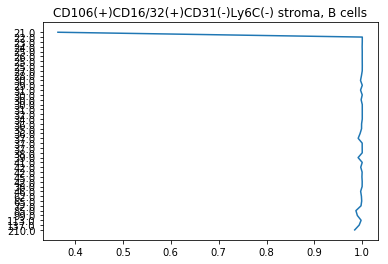

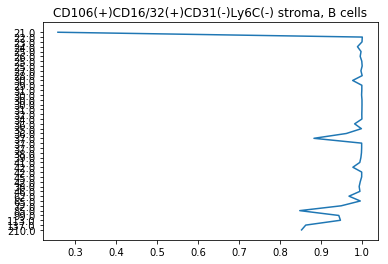

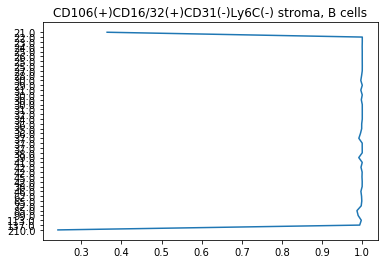

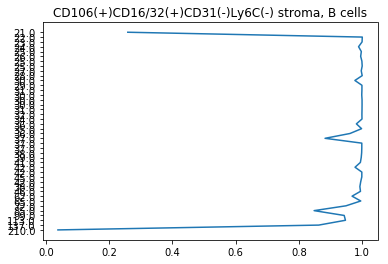

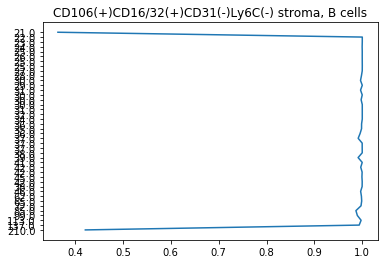

...

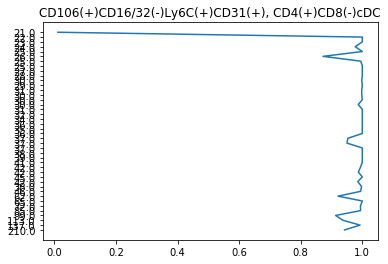

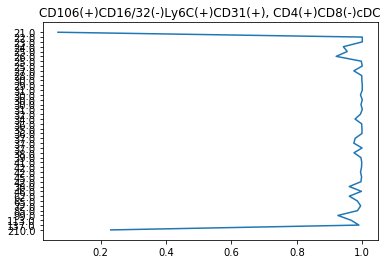

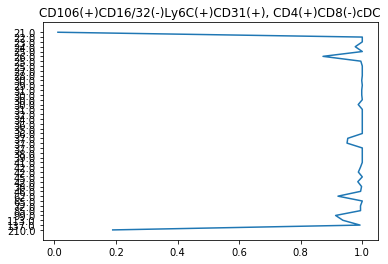

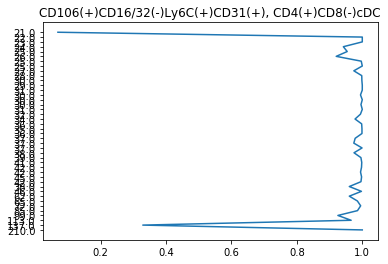

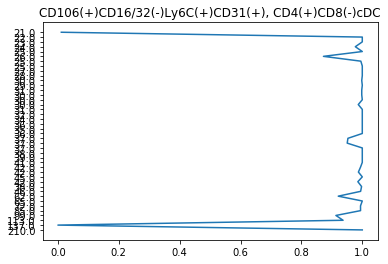

In [5]:
sample_name = 'combined'
tree = pickle.load(open('tree_combined_for_html.pkl', 'rb'))
paths = list(get_paths(tree))
print('Writing graphs for {} paths.'.format(len(paths)))
for ind, path in enumerate(get_paths(tree, num_layers=None)):
    if ind % 10 == 0:
        print('Dumped {} paths'.format(ind))
    visualize_path(sample_name, tree, path, ind, start=0, save=True)
    write_metric_graph(path, ind)

In [ ]:

sample_name = 'combined'
tree = pickle.load(open('tree_combined_for_html.pkl', 'rb'))
path = next(get_paths(tree))
depth = get_tree_depth(tree)
plot_path_clusters(path, 0, depth)


In [1]:
import os
import subprocess
sample_name = 'combined'
for i in range(len(os.listdir('Metric_Graphs_Combined'))):
    if i % 10 == 0:
        print('Submitting job', i)
    if not os.path.isfile('Clusters_Combined/Clusters_{}.tar.gz'.format(i)):
        subprocess.Popen('sbatch draw_path.sh {}'.format(i), shell=True)

Submitting job 0
Submitting job 10
Submitting job 20
Submitting job 30
Submitting job 40
Submitting job 50
Submitting job 60
Submitting job 70
Submitting job 80
Submitting job 90
Submitting job 100
Submitting job 110
Submitting job 120
Submitting job 130
Submitting job 140
Submitting job 150
Submitting job 160
Submitting job 170
Submitting job 180
Submitting job 190
Submitting job 200
Submitting job 210
Submitting job 220
Submitting job 230
Submitting job 240
Submitting job 250
Submitting job 260
Submitting job 270
Submitting job 280
Submitting job 290
Submitting job 300


## Write Tree Nodes to Files 

In [4]:
tree = pickle.load(open('tree_combined_for_html.pkl', 'rb'))
def write_node_data_to_files(tree):
    if not os.path.isdir('Node_Data'):
        os.mkdir('Node_Data')
    layers = get_layers(tree)
    for layer_ind, layer in enumerate(layers):
        for node_ind, node in enumerate(layer):
            node.coords.to_csv('Node_Data/Layer_{}_Node_{}.csv'.format(layer_ind, node_ind), index=False)
            
    # plot tree with labels 
    labelled_tree = recreate_tree(tree, color=False)
    ts = TreeStyle()
    ts.show_leaf_name = False
    ts.rotation = 90
    def my_layout(node):
        F = TextFace(node.name, tight_text=True)
        F.rotation = 270
        add_face_to_node(F, node, column=0, position="branch-right")
        F.border.width = 1
        F.inner_border.width = 1
    ts.layout_fn = my_layout
    for layer_ind, layer in enumerate(get_layers(labelled_tree)):
        for node_ind, node in enumerate(layer):
            node.add_features(name='Layer_{}_Node_{}'.format(layer_ind, node_ind))
            
    labelled_tree.render('labelled_tree.pdf', tree_style=ts)
    
write_node_data_to_files(tree)